In [1]:
from tools import analytics

**Should**
- Highlight commonalities
- Limitations
- Intereseting samples (both images and labels)

### Load, process and vizualize training samples and labels

In [2]:
cfg_file = analytics.get_config("neuralvision/configs/tdt4265.py")
cfg, dataset, gpu_tfms = analytics.prepare_dataset(cfg_file, dataset_type="train", batch_size=1)
img_mean, img_std = analytics.calculate_mean_std(cfg)

Saving SSD outputs to: outputs/


In [3]:
metadata = analytics.load_annotation_file(cfg)
annotations = analytics.process_annotations(metadata["annotations"])
catagories = analytics.process_categories(metadata["categories"])

In [4]:
# Replace category_id with category_name from catagories
annotations["category_id"] = annotations["category_id"].map(catagories.set_index("id")["name"])

In [5]:
annotations.head()

,id,image_id,category_id,area,xmin,ymin,xmax,ymax,width,height
0,1,1,car,280.2960,725.93,63.64,746.33,77.38,20.40,13.74
1,2,1,person,248.6808,351.26,81.08,359.20,112.40,7.94,31.32
2,3,1,scooter,171.6447,187.57,81.25,194.84,104.86,7.27,23.61
3,4,1,scooter,144.4352,431.30,87.54,438.58,107.38,7.28,19.84
4,5,1,car,1454.7000,107.80,78.10,145.10,117.10,37.30,39.00


In [6]:
metrics_frame = analytics.get_category_metrics(annotations["category_id"], decimals=2)
metrics_frame

,category,total,in %
0,car,9563,52.29
1,person,4910,26.85
2,rider,1588,8.68
3,bicycle,1043,5.70
4,scooter,615,3.36
5,bus,445,2.43
6,truck,123,0.67


### Statistics of ALL types boxes

In [7]:
annotations.drop(columns=["id", "image_id", "category_id"]).describe().round(3)

,area,xmin,ymin,xmax,ymax,width,height
count,18287.000,18287.000,18287.000,18287.000,18287.000,18287.000,18287.000
mean,786.196,411.263,72.159,431.351,98.939,20.088,26.780
std,2311.536,295.438,11.617,296.342,19.066,26.371,16.645
min,9.990,0.000,0.000,3.200,60.100,2.010,3.320
25%,121.077,118.700,66.045,143.230,84.070,6.930,13.910
50%,261.116,457.570,72.060,475.260,94.030,12.710,22.310
75%,675.330,556.535,77.990,577.260,116.385,22.030,36.285
max,51046.400,1020.090,121.040,1024.000,128.000,398.800,128.000


### Statistics of CAR boxes

In [8]:
cars = annotations[annotations["category_id"] == "car"]
cars.drop(columns=["id", "image_id", "category_id"]).describe().round(3)

,area,xmin,ymin,xmax,ymax,width,height
count,9563.000,9563.000,9563.000,9563.000,9563.000,9563.000,9563.000
mean,996.868,369.640,73.523,398.045,99.579,28.405,26.056
std,1586.448,294.579,10.256,297.023,20.254,26.552,15.649
min,9.990,0.000,1.550,3.200,61.400,2.700,3.320
25%,189.858,48.715,67.225,74.245,83.010,13.365,13.060
50%,411.817,442.300,72.750,472.170,93.600,19.670,21.760
75%,1281.372,511.505,78.320,537.300,126.655,32.870,37.290
max,32424.309,1020.090,121.040,1024.000,128.000,256.420,126.450


### Statistics of TRUCK boxes

In [9]:
cars = annotations[annotations["category_id"] == "truck"]
cars.drop(columns=["id", "image_id", "category_id"]).describe().round(3)

,area,xmin,ymin,xmax,ymax,width,height
count,123.000,123.000,123.000,123.000,123.000,123.000,123.000
mean,5743.523,209.688,37.351,265.836,92.122,56.148,54.770
std,11132.194,253.489,22.220,258.501,21.116,82.912,41.132
min,156.854,1.280,0.000,9.620,64.700,8.330,14.430
25%,301.687,6.830,24.790,21.475,77.235,14.645,20.600
50%,714.950,19.920,44.010,106.850,85.120,22.290,39.090
75%,3792.811,465.725,45.870,500.520,106.170,46.660,81.305
max,45145.170,618.680,70.760,637.040,128.000,355.250,128.000


### STATISTICAL Observations based on initial intuition

**Catagories**
- We can see that we have quite skewed distribution of catagories.
- There are considerly more cars ($9563$ in this set) then anything else, above $50 \%$ of the total dataset.
- Looking at the CAR boxes, we can see that the average width and height in pixels of the bounding boxes are are $28.405$ and $26.056$ respectively.   
  This would then indicate that if an image is $1024 x 128$ in width and heigth, then the relative box width and height would be $2.8 \%$ and $20.4 \%$. (??).   
  This indicates that we're looking at a relatively small bounding boxes in spesific areas of the image and not soo much big objects.   
  (See following sections for actual visualizations).


**Boxes**
- Give that we mostly have cars (above $50 \%$), then we could expect best performance on boxes with close to quadratic or rectangular shapes with some what even distribution of aspect ratios.
- Similary for persons, which have a entierly different shape of boxes compared to cars. Here we're facing tall and slim rectangular boxes.
- On the other hand of the scale, the largets feasible rectangular shapes are poorly represented in the dataset and could (?) naturally therefore be thought of as harder objects to detect.
- The same could be said for busses, as these two (respepectfully at $0.67 \%$ and $2.43 \%$ of the dataset) are close to represetning only $3 \%$ of the dataset.
- 

**Supported keys for single sample**
- Key [image]: shape=torch.Size([1, 3, 128, 1024]), dtype=torch.float32
- Key [boxes]: shape=torch.Size([1, 14, 4]), dtype=torch.float32
- Key [labels]: shape=torch.Size([1, 14]), dtype=torch.int64
- Key [width]: shape=torch.Size([1]), dtype=torch.int64
- Key [height]: shape=torch.Size([1]), dtype=torch.int64
- Key [image_id]: shape=torch.Size([1]), dtype=torch.int64
"""


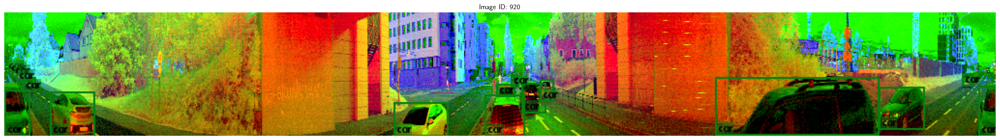

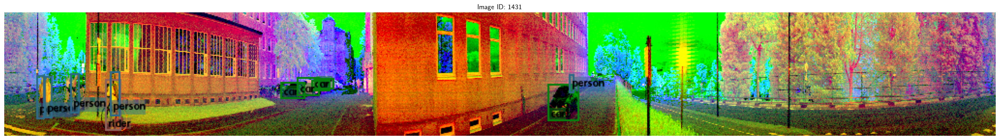

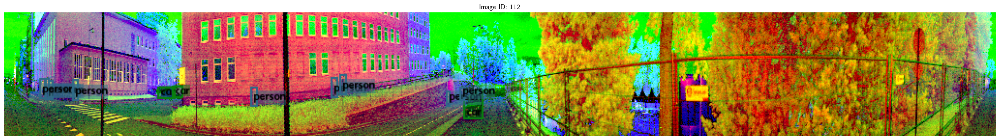

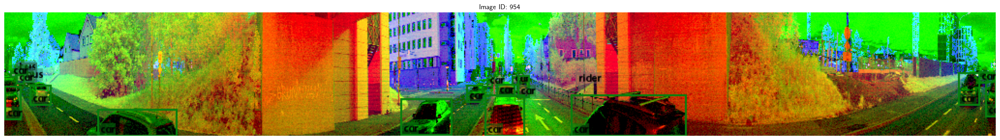

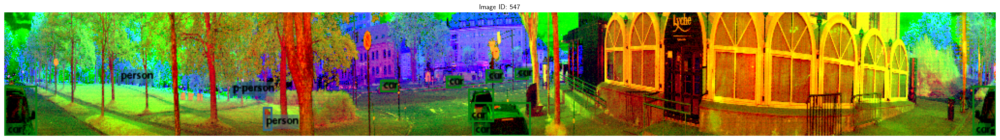

In [10]:
N_SAMPLES = 5
image_iterator = iter(dataset)

for _ in range(N_SAMPLES):
    analytics.visualize_sample(
        it=image_iterator,
        lblmap=cfg.label_map,
        tfms=gpu_tfms,
        image_mean=img_mean,
        image_std=img_std
    )

### VISUAL Observation based on initial intuition

- Initial observations revealed quite a few incorrect / missplaced annotation boxes.
- The shape of the bounding boxes varies greatly. The following shapes have been observed:
    - Most of the bounding boxes are rectangular.
    - Some of the bounding boxes are quite tall, but short in width.
    - Some of the bounding boxes are almost square, but not quite.
    - The sizes varies greatly, and can be everything from a few pixels to a few hundred pixels.
      (e.g. could have a picture with a huge bounding box of a bus and a tiny slim box of a person or a bicyle for that matter.)
- Certain boxes are occluded behind other objects, which makes it hard to see. 